# Modeling the Quark-Gluon Plasma (QGP) using relativistic Navier-Stokes equations for the glasma 
-----
(Version ii)
---
---


======================
---



In [1]:
import numpy as np
from scipy.integrate import solve_ivp
import plotly.graph_objects as go
from plotly.subplots import make_subplots

In [96]:
# Constants and parameters
c = 1.0  # Speed of light in natural units
eta = 0.1  # Shear viscosity coefficient
zeta = 0.05  # Bulk viscosity coefficient
gamma = 5/3  # Adiabatic index for a relativistic gas
gamma_qgp = 4/3  # Adiabatic index (for QGP)
x_max = 10.0  # Spatial domain size
t_max = 5.0  # Maximum simulation time
dx = 0.1  # Spatial step size
dt = 0.01  # Time step size
L = 10.0  # Length of the spatial domain
T = 5.0  # Total simulation time
N = int(L / dx) + 1  # Number of spatial grid points
M = int(T / dt) + 1  # Number of time steps

In [ ]:
# Grid parameters
L = 10.0    # Spatial domain length
Nx = 100    # Number of spatial points
nx = Nx
x = np.linspace(0, L, nx)  # Spatial grid points
dx = L / Nx # Spatial step size
dt = 0.01   # Time step size
Nt = 1000   # Number of time steps

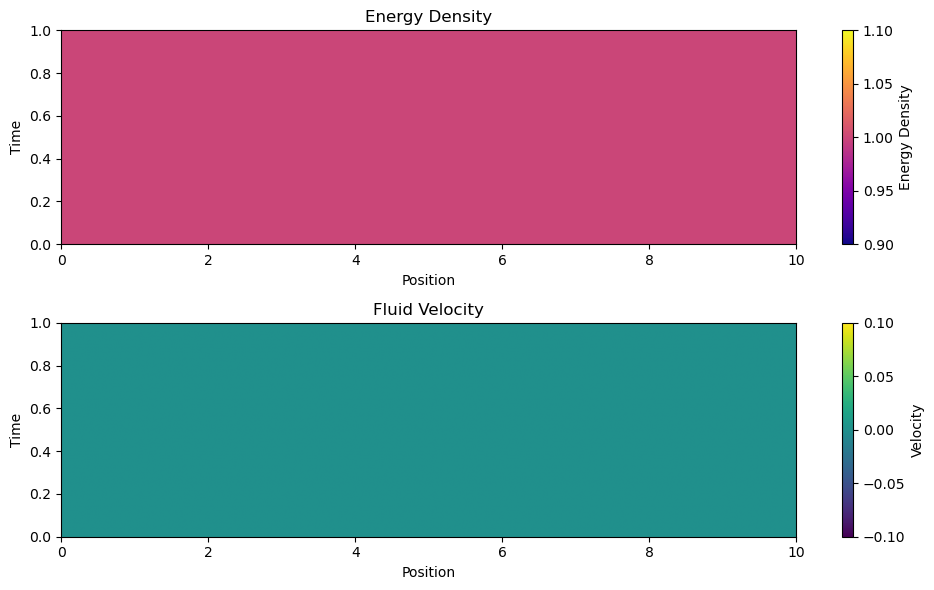

In [94]:
# Initial conditions
epsilon_initial = np.ones(nx) * 1.0  # Initial energy density (set to 1 for simplicity)
u_initial = np.zeros(nx)  # Initial fluid velocity (starts at rest)

# Time parameters
t_max = 1.0  # Maximum simulation time
dt = 0.001  # Time step
nt = int(t_max / dt)  # Number of time steps

# Arrays to store results
epsilon = np.zeros((nt, nx))  # Energy density over time
u = np.zeros((nt, nx))  # Fluid velocity over time

# Set initial conditions
epsilon[0, :] = epsilon_initial
u[0, :] = u_initial

# Main loop (time evolution)
for n in range(nt - 1):
    # Compute pressure
    p = (gamma - 1) * epsilon[n, :]
    
    # Upwind scheme for energy density
    depsilon_dx = np.zeros(nx)
    depsilon_dx[1:] = (epsilon[n, 1:] - epsilon[n, :-1]) / dx  # Forward difference
    depsilon_dx[0] = (epsilon[n, 0] - epsilon[n, -1]) / dx  # Periodic boundary condition
    
    epsilon[n + 1, :] = epsilon[n, :] - dt * depsilon_dx * u[n, :]
    
    # Upwind scheme for velocity
    du_dx = np.zeros(nx)
    du_dx[1:] = (u[n, 1:] - u[n, :-1]) / dx  # Forward difference
    du_dx[0] = (u[n, 0] - u[n, -1]) / dx  # Periodic boundary condition
    
    u[n + 1, :] = u[n, :] - dt * (u[n, :] * du_dx + 1 / (epsilon[n, :] + p) * depsilon_dx)
    
# Plotting
plt.figure(figsize=(10, 6))

plt.subplot(2, 1, 1)
plt.title('Energy Density')
plt.imshow(epsilon, extent=[0, L, 0, t_max], aspect='auto', cmap='plasma', origin='lower')
plt.colorbar(label='Energy Density')
plt.xlabel('Position')
plt.ylabel('Time')

plt.subplot(2, 1, 2)
plt.title('Fluid Velocity')
plt.imshow(u, extent=[0, L, 0, t_max], aspect='auto', cmap='viridis', origin='lower')
plt.colorbar(label='Velocity')
plt.xlabel('Position')
plt.ylabel('Time')

plt.tight_layout()
plt.show()


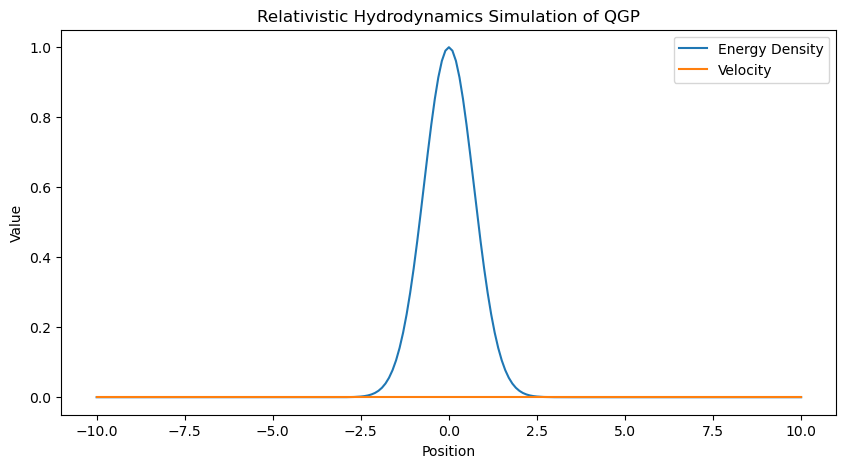

In [54]:
# Grid initialization
x = np.arange(-x_max, x_max + dx, dx)
n_x = len(x)

# Initial conditions (Gaussian energy density profile)
epsilon = np.exp(-x**2)
p = epsilon / 3  # Equation of state for an ideal gas (p = epsilon / 3)
u = np.zeros(n_x)  # Initial velocity (zero everywhere)

# Helper functions
def pressure(epsilon):
    return epsilon / 3

def flux(epsilon, u):
    return (epsilon + pressure(epsilon)) * u

# Time evolution
t = 0.0
while t < t_max:
    # Calculate fluxes
    F_epsilon = flux(epsilon, u)
    F_momentum = flux(epsilon + pressure(epsilon), u)
    
    # Update energy density and velocity using finite difference method
    epsilon_new = epsilon.copy()
    u_new = u.copy()
    
    # Calculate differences with appropriate lengths
    F_epsilon_diff = np.zeros_like(F_epsilon)
    F_momentum_diff = np.zeros_like(F_momentum)
    
    F_epsilon_diff[1:] = F_epsilon[1:] - F_epsilon[:-1]
    F_momentum_diff[1:] = F_momentum[1:] - F_momentum[:-1]
    
    # Update interior points using finite difference method
    epsilon_new[1:-1] = epsilon[1:-1] - dt / dx * F_epsilon_diff[1:-1]
    u_new[1:-1] = u[1:-1] - dt / dx * F_momentum_diff[1:-1] / (epsilon[1:-1] + pressure(epsilon[1:-1]))
    
    # Apply boundary conditions (e.g., zero gradient)
    epsilon_new[0] = epsilon_new[1]
    epsilon_new[-1] = epsilon_new[-2]
    u_new[0] = u_new[1]
    u_new[-1] = u_new[-2]
    
    # Update variables
    epsilon = epsilon_new
    u = u_new
    t += dt

# Plot results
plt.figure(figsize=(10, 5))
plt.plot(x, epsilon, label='Energy Density')
plt.plot(x, u, label='Velocity')
plt.xlabel('Position')
plt.ylabel('Value')
plt.legend()
plt.title('Relativistic Hydrodynamics Simulation of QGP')
plt.show()


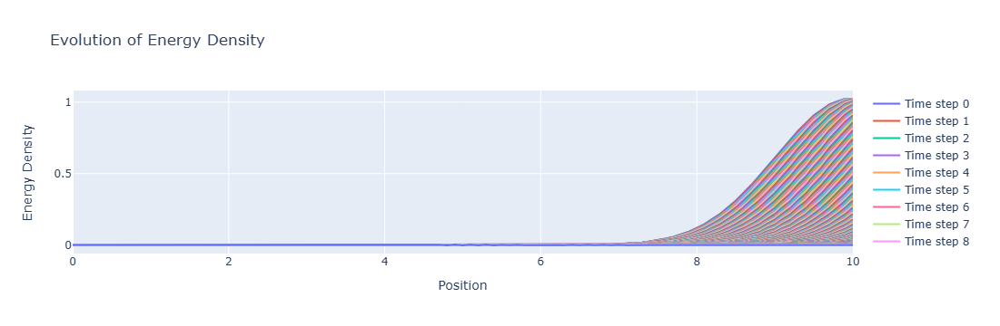

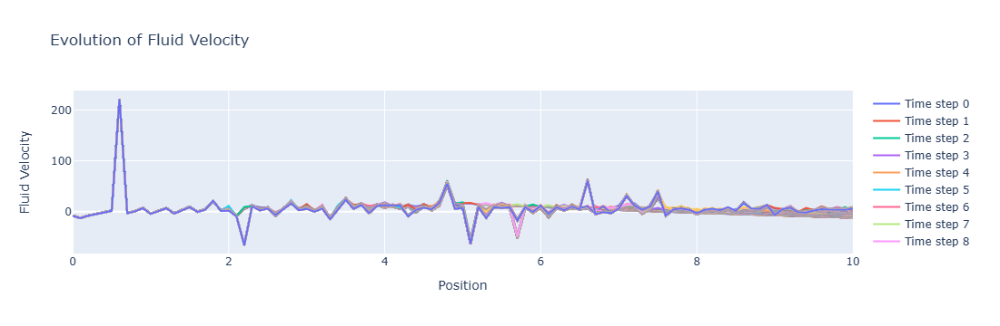

In [97]:
# Evolve the system using Euler's method
for i in range(M):
    # Store current state
    epsilon_history[i, :] = epsilon.copy()
    u_history[i, :] = u.copy()

    # Calculate derivatives
    d_epsilon_dx = np.gradient(epsilon, dx)
    d_p_over_epsilon = 1.0  # Example: Pressure gradient (assume constant for simplicity)

    # Update equations (ideal, perfect fluid Euler equations)
    epsilon += dt * (-d_p_over_epsilon * d_epsilon_dx)
    u += dt * c ** 2 * d_epsilon_dx / epsilon

# Create plots using Plotly
x = np.linspace(0, L, N)

# Plot energy density evolution
fig1 = go.Figure()
for i in range(M):
    fig1.add_trace(go.Scatter(x=x, y=epsilon_history[i, :], mode='lines', name=f'Time step {i}'))
fig1.update_layout(
    title='Evolution of Energy Density',
    xaxis_title='Position',
    yaxis_title='Energy Density',
    showlegend=True
)

# Plot fluid velocity evolution
fig2 = go.Figure()
for i in range(M):
    fig2.add_trace(go.Scatter(x=x, y=u_history[i, :], mode='lines', name=f'Time step {i}'))
fig2.update_layout(
    title='Evolution of Fluid Velocity',
    xaxis_title='Position',
    yaxis_title='Fluid Velocity',
    showlegend=True
)

# Display the plots
fig1.show()
fig2.show()

In [3]:
# Initial conditions
x = np.linspace(0, L, Nx)
u0 = np.zeros(Nx)  # Initial velocity (rest)
epsilon0 = np.exp(-((x - L/2) ** 2))  # Gaussian energy density profile
p0 = (gamma - 1) * epsilon0  # Equation of state: p = (gamma - 1) * epsilon

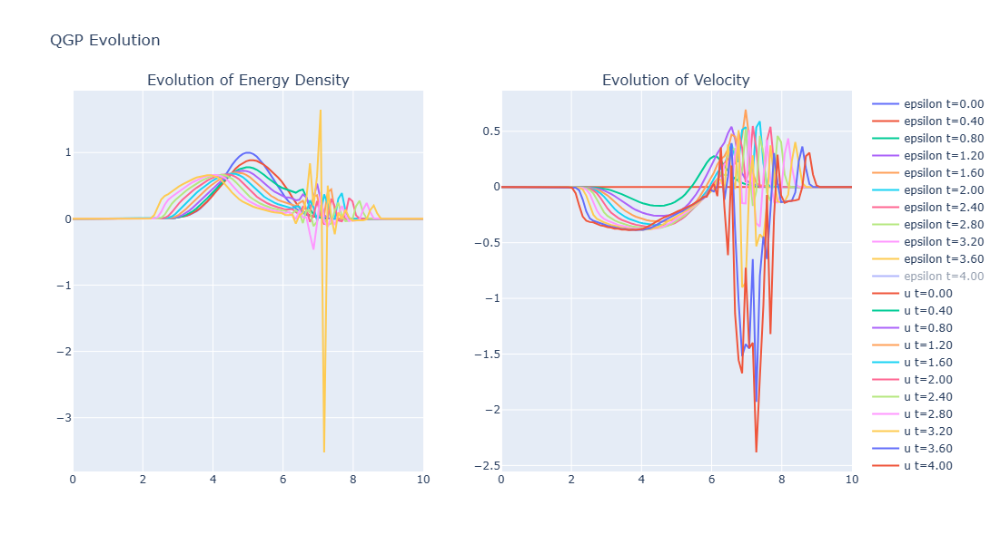

In [5]:
# Function to calculate fluxes
def flux(u, epsilon, p):
    F_u = u * epsilon + p  # Momentum flux
    F_epsilon = u * (epsilon + p)  # Energy flux
    return F_u, F_epsilon

# Function to calculate the source terms
def source(u, epsilon, p):
    S_u = - (p + zeta * np.gradient(u, dx)) * np.gradient(u, dx)  # Source for momentum
    S_epsilon = - (p + zeta * np.gradient(u, dx)) * np.gradient(epsilon, dx)  # Source for energy
    return S_u, S_epsilon

# Function to compute derivatives
def compute_derivatives(t, y):
    u = y[:Nx]
    epsilon = y[Nx:2*Nx]
    p = (gamma - 1) * epsilon  # Equation of state
    
    # Calculate fluxes and sources
    F_u, F_epsilon = flux(u, epsilon, p)
    S_u, S_epsilon = source(u, epsilon, p)
    
    # Compute spatial derivatives of fluxes
    dF_u_dx = np.gradient(F_u, dx)
    dF_epsilon_dx = np.gradient(F_epsilon, dx)
    
    # Compute the time derivatives
    du_dt = -dF_u_dx + S_u
    depsilon_dt = -dF_epsilon_dx + S_epsilon
    
    return np.concatenate([du_dt, depsilon_dt])

# Initial state vector
y0 = np.concatenate([u0, epsilon0])

# Time array
t_span = (0, Nt * dt)
t_eval = np.linspace(0, Nt * dt, Nt)

# Solve the system of equations
solution = solve_ivp(compute_derivatives, t_span, y0, t_eval=t_eval, method='RK45')

# Extract solutions
u_sol = solution.y[:Nx, :]
epsilon_sol = solution.y[Nx:2*Nx, :]

# Create subplots
fig = make_subplots(rows=1, cols=2, subplot_titles=("Evolution of Energy Density", "Evolution of Velocity"))

# Plot energy density evolution
for i in range(0, len(solution.t), len(solution.t)//10):
    fig.add_trace(go.Scatter(x=x, y=epsilon_sol[:, i], mode='lines', name=f'epsilon t={solution.t[i]:.2f}'), row=1, col=1)

# Plot velocity evolution
for i in range(0, len(solution.t), len(solution.t)//10):
    fig.add_trace(go.Scatter(x=x, y=u_sol[:, i], mode='lines', name=f'u t={solution.t[i]:.2f}'), row=1, col=2)

# Update layout
fig.update_layout(height=600, width=1200, title_text="QGP Evolution", showlegend=True)

# Show plot
fig.show()


C:\Users\Ali\AppData\Local\Temp\ipykernel_8976\2361286075.py:61: UserWarning:

Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all axes decorations.



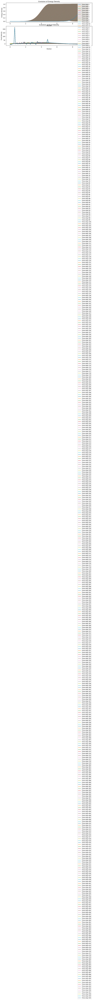

In [95]:

# Initial conditions
epsilon = np.zeros(N)  # Initial energy density
u = np.zeros(N)  # Initial fluid velocity (normalized to c)

# Setting initial conditions: Example of a Gaussian energy density profile
x0 = L / 2.0
sigma = 1.0
epsilon = np.exp(-((np.linspace(0, L, N) - x0) ** 2) / (2 * sigma ** 2))

# Arrays to store results
epsilon_history = np.zeros((M, N))
u_history = np.zeros((M, N))

# Evolve the system using Euler's method
for i in range(M):
    # Store current state
    epsilon_history[i, :] = epsilon.copy()
    u_history[i, :] = u.copy()

    # Calculate derivatives
    d_epsilon_dx = np.gradient(epsilon, dx)
    d_p_over_epsilon = 1.0  # Example: Pressure gradient (assume constant for simplicity)

    # Update equations (ideal, perfect fluid Euler equations)
    epsilon += dt * (-d_p_over_epsilon * d_epsilon_dx)
    u += dt * c ** 2 * d_epsilon_dx / epsilon

# Plotting the evolution of energy density and velocity
x = np.linspace(0, L, N)

plt.figure(figsize=(12, 6))

plt.subplot(2, 1, 1)
plt.title('Evolution of Energy Density')
plt.xlabel('Position')
plt.ylabel('Energy Density')
for i in range(M):
    plt.plot(x, epsilon_history[i, :], label=f'Time step {i}')
plt.legend()

plt.subplot(2, 1, 2)
plt.title('Evolution of Fluid Velocity')
plt.xlabel('Position')
plt.ylabel('Fluid Velocity')
for i in range(M):
    plt.plot(x, u_history[i, :], label=f'Time step {i}')
plt.legend()

plt.tight_layout()
plt.show()
